# ***Predicting Ozone Non-attainment Zones in the USA***
                                   

# **Introduction:**
Tropospheric ozone is an important pollutant and potent greenhouse gas. Thus, there should be regulations of how much tropospheric ozone can be in the air. If an area is designated nonattainment, it warrants expensive and intensive oversight to bring the area back into attainment levels. (In United States environmental law, a non-attainment area is an area considered to have air quality worse than the National Ambient Air Quality Standards).Predicting nonattainment would allow areas to take action before they are forced to, allowing them greater flexibility and time in how they meet attainment. I have used several different models to predict tropospheric ozone. The input to my algorithm is {Temperature, Latitude, Longitude, NO2 levels, VOC levels}.

 

# **Dataset and Features:**

For the project, I have used Google BigQuery’ public data interface. For training and testing I used the “EPA Historical Air Quality” dataset. This dataset contains daily data on many
pollutants and meteorological features from 2010 through 2019. Data is collected from 1025 unique sites(locations) throughout the United States. 

For the data, I have aggregated daily information about Temperature, NO2 levels, VOC (volatile organic compounds) levels by day and location, so that each row represented measurements of each attribute for one site (location) for one day.
I chose to look at Temperature, NO2 and VOCs because NOx, VOCs, and sunlight are precursors to ozone. I used these inputs as tropospheric ozone is formed by the interaction of sunlight, particularly ultraviolet light, with hydrocarbons and nitrogen oxides. Thus, the use of **temperature** and **NO2 levels**. Methane, a **VOC** whose atmospheric concentration has increased tremendously during the last century also significantly contributes to ozone formation. Also the distribution of total tropsopheric ozone over the Earth varies with location on timescales that range from daily to seasonal, hence the use of **latitude** and **longitude**. 

The data went through some preprocessing before we used it to train the model. We have trained on 1,02,607 points from 2010-2018, and tested on 6,979 points from January-December 2019. 

In [ ]:
#Importing Libraries

import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error
pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Loading The Dataset:**

In [ ]:
training_data_file_path="/content/drive/MyDrive/Ozone Project/Training_data.csv"
test_data_file_path="/content/drive/MyDrive/Ozone Project/testnew.csv"

In [ ]:
training_data=pd.read_csv(training_data_file_path, index_col="datelocal", parse_dates=True)
test_data=pd.read_csv(test_data_file_path, index_col="datelocal", parse_dates=True)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (22) have mixed types.Specify dtype option on import or set low_memory=False.



In [ ]:
print('The shape of our training data is:', training_data.shape)
print('The shape of our test data is:', test_data.shape)

The shape of our training data is: (102607, 22)
The shape of our test data is: (6979, 20)


### **Selecting the feautures and target for the data:**

In [ ]:
#Renaming the columns
training_data = training_data.rename(columns= {'arithmeticmean_v':'vocs', 'arithmeticmean_n': 'no2', 'arithmeticmean_o':'ozone', 'arithmeticmean_t':'temp'})

#Prediction Target
y = training_data.ozone

#Choosing Features
features= ['vocs', 'no2','temp','latitude','longitude']

#Data we will use to predict ozone
x= training_data[features]


In [ ]:
#Seeting features and target for test data

test_data = test_data.rename(columns= {'arithmeticmean_v':'vocs', 'arithmeticmean_n': 'no2', 'arithmeticmean_o':'ozone', 'arithmeticmean_t':'temp'})
val_y= test_data.ozone
val_x=test_data[features]

### **Visualizing the Sites:**

In [ ]:
locations  = test_data[['latitude', 'longitude']]
locationlist = locations.values.tolist()
popup=test_data[['cityname']]

In [ ]:
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

map_osm = folium.Map(location=[38.56, -101.84],
                    # tiles='Stamen Toner',
                     zoom_start=4.8) 

for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point], popup=popup.iloc[point,0]).add_to(map_osm)

map_osm

# **Methods:**
We focused on five kinds of algorithms: Random-Forest, Gradient boosting, Linear regression, Light GBM and Neural networks to predict Tropospheic Ozone. We then evaluated our models' performances using Mean Absolute Error and Accuracy percentage.


## **1. Random Forest Regression:**

Decision Tree is a useful approach that can capture non-linear trends in data set. However, because decision trees are prone to high variance that is dependent on random splits, we have used Random Forests. The random forest uses many trees, and it makes a prediction by averaging the predictions of each component tree. It generally has much better predictive accuracy than a single decision tree and works well with default parameters.

In [ ]:
#Random Forest Regression

from sklearn.ensemble import RandomForestRegressor

#fit training data to forest model
ozone_model_r= RandomForestRegressor(random_state=1)
ozone_model_r.fit(x,y)

#make predictions using forest model on test data
ozone_predictions_rf= ozone_model_r.predict(val_x)

**Mean Absolute Error Accuracy of Random Forests:**

In [ ]:
#Calculate MAE

error= mean_absolute_error(ozone_predictions_rf,val_y)
print('Mean Absolute Error:', round(error, 5))

# Calculate and display accuracy

mape = 100 * (error / val_y)
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.00661
Accuracy: 71.79 %.


**Comparison of predicted Ozone using RF vs true Ozone:**

Text(0, 0.5, 'Ozone level in Parts per million')

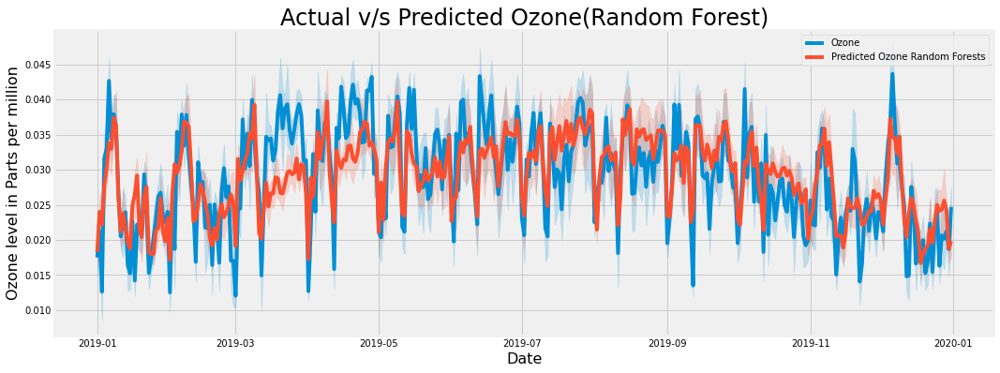

In [ ]:
plt.figure(figsize=(16,6))

sns.lineplot(x=test_data.index, y=test_data['ozone'], label="Ozone")
sns.lineplot(x=test_data.index, y= ozone_predictions_rf, label="Predicted Ozone Random Forests")
plt.title( "Actual v/s Predicted Ozone(Random Forest)",size=24)
plt.xlabel("Date", size=16)
plt.ylabel("Ozone level in Parts per million", size=16)

##**2. XGBoost:**

XGBoost is an implementation of the Gradient Boosted Decision Trees algorithm, We go through cycles that repeatedly builds new models and combines them into an ensemble model. We start the cycle by calculating the errors for each observation in the dataset. We then build a new model to predict those. We add predictions from this error-predicting model to the "ensemble of models."

To make a prediction, we add the predictions from all previous models. We can use these predictions to calculate new errors, build the next model, and add it to the ensemble.

In [ ]:
from xgboost import XGBRegressor

ozone_model_xgb = XGBRegressor(n_estimators=1500,  learning_rate=0.1, n_jobs=5)
ozone_model_xgb.fit(x,y)
ozone_predictions_xgb = ozone_model_xgb.predict(val_x)

[06:45:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


**Mean Absolute Error and Accuracy:**

In [ ]:
#Calculate MAE

error_xgb=mean_absolute_error(ozone_predictions_xgb, val_y)
print('Mean Absolute Error:', round(error_xgb, 5))

# Calculate and display accuracy

mape_xgb = 100 * (error_xgb / val_y)
accuracy_xgb = 100 - np.mean(mape_xgb)
print('Accuracy:', round(accuracy_xgb, 2), '%.')

Mean Absolute Error: 0.00643
Accuracy: 72.55 %.


**Comparison of predicted Ozone using XGBoost vs true Ozone:**

Text(0, 0.5, 'Ozone level in Parts per million')

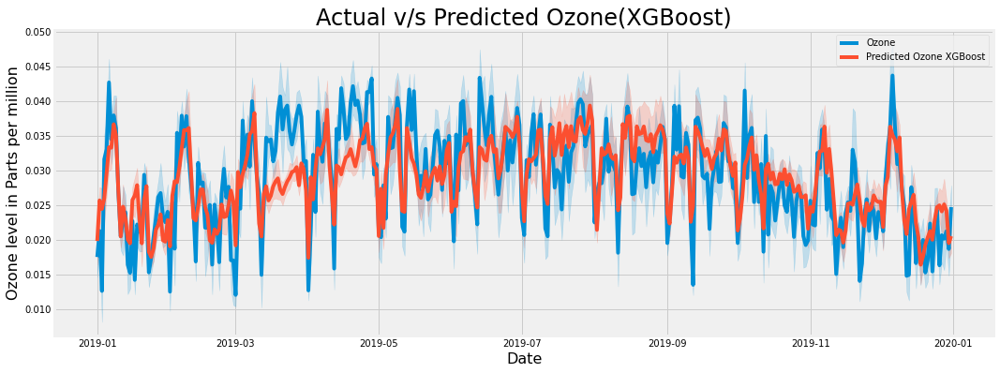

In [ ]:
plt.figure(figsize=(16,6))

sns.lineplot(x=test_data.index, y=test_data['ozone'], label="Ozone")
sns.lineplot(x=test_data.index, y=ozone_predictions_xgb, label="Predicted Ozone XGBoost")
plt.title( "Actual v/s Predicted Ozone(XGBoost)",size=24)
plt.xlabel("Date", size=16)
plt.ylabel("Ozone level in Parts per million", size=16)

## **3. Linear Regression:**

The Linear Regression model for this project comes from SKLearns linear model library. It fits a linear model with coefficients a = (a1, …, an) to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation.

In [ ]:
#Linear Regression

from sklearn.linear_model import LinearRegression

lf_model = LinearRegression()
lf_model.fit(x,y)
lf_val_predictions = lf_model.predict(val_x)

**Mean Absolute Error and Accuracy:**

In [ ]:
#Calculate MAE

lf_val_mae = mean_absolute_error(lf_val_predictions, val_y)
print('Mean Absolute Error:', round(lf_val_mae, 5))

# Calculate and display accuracy

mape_lr = 100 * (lf_val_mae/ val_y)
accuracy_lr = 100 - np.mean(mape_lr)
print('Accuracy:', round(accuracy_lr, 2), '%.')

Mean Absolute Error: 0.00787
Accuracy: 66.4 %.


**Comparison of predicted Ozone using Linear Regression vs true Ozone:**

Text(0, 0.5, 'Ozone level in Parts per million')

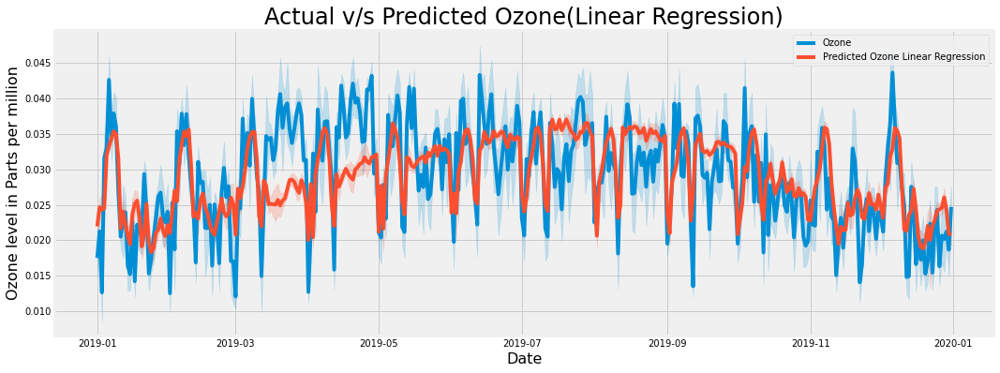

In [ ]:
plt.figure(figsize=(16,6))

sns.lineplot(x=test_data.index, y=test_data['ozone'], label="Ozone")
sns.lineplot(x=test_data.index, y=lf_val_predictions, label="Predicted Ozone Linear Regression")
plt.title( "Actual v/s Predicted Ozone(Linear Regression)",size=24)
plt.xlabel("Date", size=16)
plt.ylabel("Ozone level in Parts per million", size=16)

We can see that Linear Regression didn't make very acurate predictions. Actual values fluctuated a lot however the predictions couldn't mimic those fluctuations.

## **4. Light GBM:**

Light GBM is a fast, distributed, high-performance gradient boosting framework based on decision tree algorithm, used for ranking, classification and many other machine learning tasks. Since it is based on decision tree algorithms, it splits the tree leaf wise with the best fit whereas other boosting algorithms split the tree depth wise or level wise rather than leaf-wise. So when growing on the same leaf in Light GBM, the leaf-wise algorithm can reduce more loss than the level-wise algorithm and hence results in much better accuracy which can rarely be achieved by any of the existing boosting algorithms.

**Light GBM Regressor** 

In [ ]:
# Light GBM Regressor 
from lightgbm import LGBMRegressor

#fitting training data to LightGBM 
model_LGBM = LGBMRegressor(random_state=1)
model_LGBM.fit(x, y)

#make predictions using LightGBM
gbmpredictions = model_LGBM.predict(val_x)


In [ ]:
#Calculate MAE

error= mean_absolute_error(gbmpredictions,val_y)
print('Mean Absolute Error:', round(error, 5))

# Calculate and display accuracy

mape = 100 * (error / val_y)
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.0064
Accuracy: 72.67 %.


Text(0, 0.5, 'Ozone level in Parts per million')

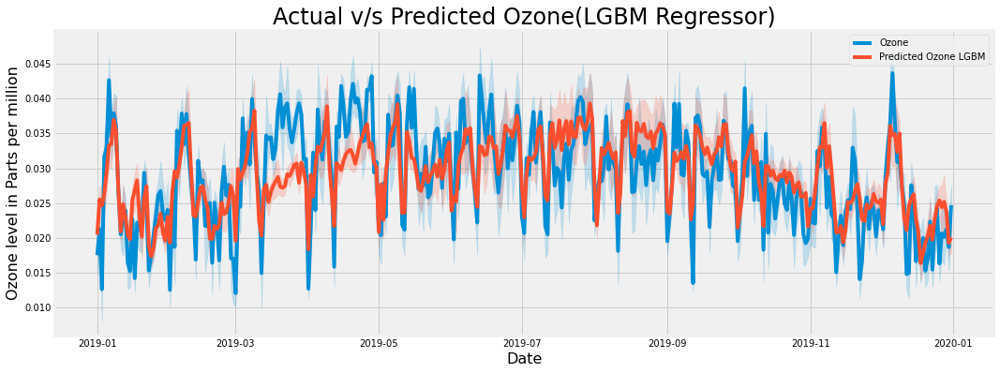

In [ ]:
plt.figure(figsize=(16,6))

sns.lineplot(x=test_data.index, y=test_data['ozone'], label="Ozone")
sns.lineplot(x=test_data.index, y=gbmpredictions, label="Predicted Ozone LGBM")
plt.title( "Actual v/s Predicted Ozone(LGBM Regressor)",size=24)
plt.xlabel("Date", size=16)
plt.ylabel("Ozone level in Parts per million", size=16)

**Light GBM Classifier**

According to EPA tropospheric ozone is hazardous if its above 0.05 ppm. 
Hence, we have modified the data as such that if the ozone values are above 0.05 ppm, the area is labelled 1 and is a non attainment zone.
If values are below 0.05 ppm, the area is labelled as 0 and is an attainment zone. 

In [ ]:
#Modifying Data 
training_data['o3'] = [ 0 if x <0.05 else 1 for x in training_data['ozone']]
test_data['o3'] =[ 0 if x <0.05 else 1 for x in test_data['ozone']] 
o_train = training_data['o3']
o_test = test_data[['o3']]

In [ ]:
#LightGBM
import lightgbm as lgb
model_gbm = lgb.LGBMClassifier(random_state=1)
model_gbm.fit(x, o_train)
gbmpredictions = model_gbm.predict(val_x)

**Accuracy Score:**

In [ ]:
from sklearn.metrics import accuracy_score

accuracy=accuracy_score(gbmpredictions, o_test)
print('LightGBM Model accuracy score: {0:0.4f}'.format(accuracy_score(gbmpredictions, o_test)))

LightGBM Model accuracy score: 0.9640


 *Hence, our model accurately assigns the label 0 or 1, 96.4% of the times.*



In [ ]:
#Forming Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(o_test, gbmpredictions)
print('Confusion matrix\n\n', cm)
print('\nTrue Attainment Zones = ', cm[0,0])
print('\nTrue Non-Attainment Zones = ', cm[1,1])
print('\nFalse Attainment Zones = ', cm[0,1])
print('\nFalse Non-Attainment Zones = ', cm[1,0])

Confusion matrix

 [[6667   84]
 [ 167   61]]

True Attainment Zones =  6667

True Non-Attainment Zones =  61

False Attainment Zones =  84

False Non-Attainment Zones =  167


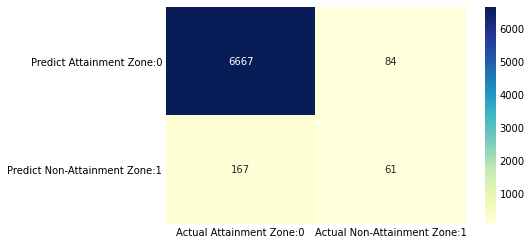

In [ ]:
#Heat Map Confusion Matrix
cm_matrix = pd.DataFrame(data=cm, columns=['Actual Attainment Zone:0', 'Actual Non-Attainment Zone:1'], 
                                 index=['Predict Attainment Zone:0', 'Predict Non-Attainment Zone:1'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## **5. Neural Networks:**


At a high level, neural
networks are layers of simpler models that feed into each other. A simple
schema is shown here below. The input to each new node is the result of
feeding a linear transformation of the layer before through an
activation function. Our neural network used the rectified linear unit function as
the activation function.We settled on a model with an
adaptive learning rate and three hidden layers of 200 nodes each. 



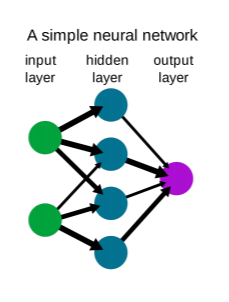

In [ ]:
#Neural Networks

from sklearn.neural_network import MLPRegressor
nn_model = MLPRegressor(learning_rate='adaptive', hidden_layer_sizes=(200,200,200))
nn_model.fit(x, y)
nn_predictions = nn_model.predict(val_x)

**Mean Absolute Error and Accuracy:**

In [ ]:
#Calculate MAE

error_n= mean_absolute_error(nn_predictions,val_y)
print('Mean Absolute Error:', round(error_n, 5))

# Calculate and display accuracy
mape_n = 100 * (error_n / val_y)
accuracy_n = 100 - np.mean(mape_n)
print('Accuracy:', round(accuracy_n, 2), '%.')

Mean Absolute Error: 0.00911
Accuracy: 61.12 %.


Text(0, 0.5, 'Ozone level in Parts per million')

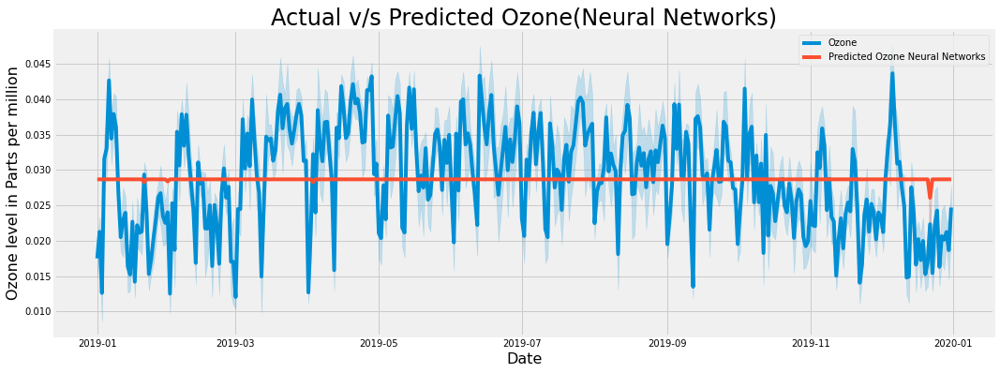

In [ ]:
plt.figure(figsize=(16,6))

sns.lineplot(x=test_data.index, y=test_data['ozone'], label="Ozone")
sns.lineplot(x=test_data.index, y= nn_predictions, label="Predicted Ozone Neural Networks")
plt.title( "Actual v/s Predicted Ozone(Neural Networks)",size=24)
plt.xlabel("Date", size=16)
plt.ylabel("Ozone level in Parts per million", size=16)


## **Features Importance:**

Feature importance is a metric used in Random Forest Regressors to determine which feautures are more important to the prediction. Using this, Temperature was the most important feature for Ozone prediction.

In [ ]:
importances = list(ozone_model_r.feature_importances_)
importances
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(features, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: temp                 Importance: 0.38
Variable: no2                  Importance: 0.23
Variable: vocs                 Importance: 0.16
Variable: latitude             Importance: 0.12
Variable: longitude            Importance: 0.11


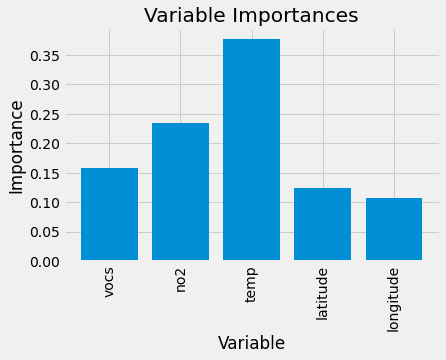

In [ ]:
plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(importances)))
# Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical')
# Tick labels for x axis
plt.xticks(x_values, features, rotation='vertical')
# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

## Inferences from Prediction

Top 5 states as Non attainment zones , Predicted by XGBoost.

In [ ]:
test_data1 = test_data.reset_index()
ozone_predxgb = pd.DataFrame(ozone_predictions_xgb, columns= ['xgb_Predictions'])
ozone_predxgb = ozone_predxgb.join(test_data1.statename)
ozone_predxgb = ozone_predxgb.groupby('statename')['xgb_Predictions'].max()
top5_xgb = ozone_predxgb.sort_values(ascending= False).head(5)
top5_xgb = top5_xgb.to_frame()

In [ ]:
fig = go.Figure()
# Create and style traces
fig.add_trace(go.Bar(x=top5_xgb.index, y=top5_xgb.xgb_Predictions))

fig.update_layout(
    title=go.layout.Title(
        text="Top 5 states as Non attainment zones , Predicted by XGBoost.",
        xref="paper",
        x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text="States",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text="Value of Ozone in PPM",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    )
)

fig.show()

Actual v/s Predicted Ozone Random Forest Regression v/s XGBoost

In [ ]:
#Actual Ozone
ActualOzone = test_data1.groupby('datelocal')['ozone'].max()
ActualOzone = ActualOzone.to_frame()

In [ ]:
# Ozone Predictions using XGBoost
ozone_predxgb1 = pd.DataFrame(ozone_predictions_xgb, columns= ['xgb_Predictions'])
ozone_predxgb1 = ozone_predxgb1.join(test_data1.datelocal)
ozone_predxgb1 = ozone_predxgb1.groupby('datelocal')['xgb_Predictions'].max()
ozone_predxgb1 = ozone_predxgb1.to_frame()

In [ ]:
#Ozone Predictions using Random Forest
ozone_predrf = pd.DataFrame(ozone_predictions_rf, columns= ['rf_Predictions'])
ozone_predrf = ozone_predrf.join(test_data1.datelocal)
ozone_predrf = ozone_predrf.groupby('datelocal')['rf_Predictions'].max()
ozone_predrf = ozone_predrf.to_frame()

In [ ]:
import plotly.graph_objects as go
fig = go.Figure()

# Create and style traces

fig.add_trace(go.Line(x=ozone_predxgb1.index, y=ozone_predxgb1.xgb_Predictions, name=' XGBoost Predicted Ozone',mode='lines+markers',
                         line=dict(color='yellow', width=4)))
fig.add_trace(go.Line(x=ActualOzone.index, y=ActualOzone.ozone, name='Actual Ozone',mode='lines+markers',
                         line=dict(color='firebrick', width=4)))
fig.add_trace(go.Line(x=ozone_predrf.index, y=ozone_predrf.rf_Predictions, name=' Random Forest Predicted Ozone',mode='lines+markers',
                         line=dict(color='blue', width=4)))

fig.update_layout(
    title=go.layout.Title(
        text="Actual v/s Predicted Ozone Random Forest Regression v/s XGBoost",
        xref="paper",
        x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text="Date",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text="Ozone values in PPM",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    )
)

fig.show()

/usr/local/lib/python3.7/dist-packages/plotly/graph_objs/_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




We can see from the above graph that XGBoost and Random Forest make identical predictions , which are close to actual data. 

# **Conclusion:**
After fitting and testing the different models on the data, XGBoost (Gradient Boosting) and Light GBM Regressor performed better than all other algorithms that we 
used and were able to predict tropospheric ozone on our test set with an accuracy of 72.56% and 72.67% respectively.

We were able to predict US non attainmentment zones acurrately 96.4% of the times using LGBM Classifier technique. 

Using Random-Forest algorithm results to investigate feature contribution, it turned out that temperature (more than 35%) contributes most to tropospheric ozone and then NO2 (approximately 25%). 

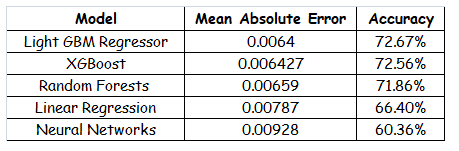

**Future Work:** There are features that we believe significantly influence ozone levels that we were unable to integrate into our data due to
time limitations, such as meteorological features such as pressure and wind, also the presence of nearby factories or major highways. 